In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from skimage.feature import hog
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split
from scipy.ndimage.measurements import label
%matplotlib inline

/home/vvs/miniconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [3]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [4]:
# Divide up into cars and notcars
non_v_names = glob.glob('non-vehicles/*.png')
v_names_far = glob.glob('vehicles/GTI_Far/*.png')
v_names_left = glob.glob('vehicles/GTI_Left/*.png')
v_names_right = glob.glob('vehicles/GTI_Right/*.png')
v_names_middle = glob.glob('vehicles/GTI_MiddleClose/*.png')
v_names_kittiex = glob.glob('vehicles/KITTI_extracted/*.png')
notcars = non_v_names
cars = np.hstack((v_names_far,v_names_left,v_names_right,v_names_middle,v_names_kittiex))
print(len(cars))
print(len(notcars))

8792
8968


vehicles/GTI_Far/image0456.png


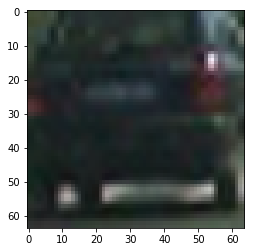

In [83]:
print(cars[0])
image = mpimg.imread(cars[0])
plt.imshow(image)

In [5]:
### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [300, None] # Min and max in y to search in slide_window()

car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
X = np.nan_to_num(X)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

/home/vvs/miniconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


In [17]:
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 6108


In [16]:
# Use a linear SVC 
svc = SVC(kernel='rbf',C=1,tol=1e-3,max_iter=1000)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

/home/vvs/miniconda3/lib/python3.6/site-packages/sklearn/svm/base.py:220: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


125.33 Seconds to train SVC...
Test Accuracy of SVC =  0.9947


In [8]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

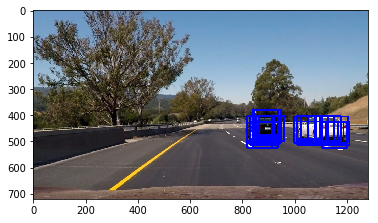

In [215]:
image = mpimg.imread('test_images/test6.jpg')

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    boxes = []
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1, hogvisualization1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False,vis=True)
    hog2, hogvisualization2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False,vis=True)
    hog3, hogvisualization3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False,vis=True)
    

    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            #hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            #test_prediction = 1
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                newbox = ((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart))
                #print(boxes)
                boxes.append(newbox)
                #print(boxes)
                
    return draw_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3

def frange(x, y, jump):
    while x < y:
        yield x
        x += jump
    
ystart = 380
ystop = 572

scale = 1.5
box_list = []
for scale in frange(1.4,1.61,0.1):
    out_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3 = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    box_list.extend(boxes)
out_img = draw_boxes(image,box_list)
plt.imshow(out_img)
newimg2 = cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR);
#cv2.imwrite('test6_boxes.jpg',newimg2)

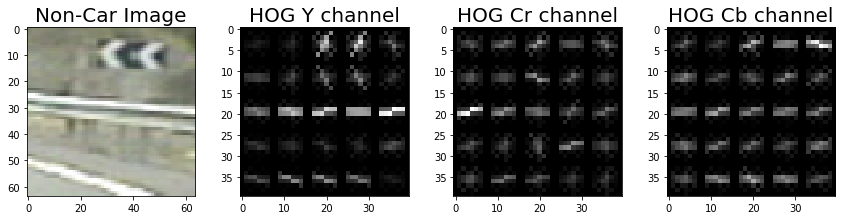

In [111]:
image = mpimg.imread('non-vehicles/image905.png')
ystart = 0
ystop = image.shape[0]
out_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3 = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 5))
f.tight_layout()    

ax1.imshow(out_img)
ax1.set_title('Non-Car Image', fontsize=20)
ax2.imshow(hogvisualization1, cmap='gray')
ax2.set_title('HOG Y channel', fontsize=20)
ax3.imshow(hogvisualization2, cmap='gray')
ax3.set_title('HOG Cr channel', fontsize=20)
ax4.imshow(hogvisualization3, cmap='gray')
ax4.set_title('HOG Cb channel', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#plt.imshow(hogvisualization1, cmap='gray')
f.savefig('NonCarImageHog.jpg')


[]


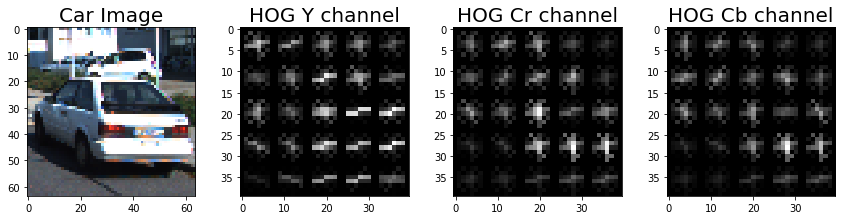

In [112]:
image = mpimg.imread('vehicles/KITTI_extracted/3394.png')
#image = (image*255)
ystart = 0
ystop = image.shape[0]

out_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3 = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

print(hist_features)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 5))
f.tight_layout()    

ax1.imshow(image)
ax1.set_title('Car Image', fontsize=20)
ax2.imshow(hogvisualization1, cmap='gray')
ax2.set_title('HOG Y channel', fontsize=20)
ax3.imshow(hogvisualization2, cmap='gray')
ax3.set_title('HOG Cr channel', fontsize=20)
ax4.imshow(hogvisualization3, cmap='gray')
ax4.set_title('HOG Cb channel', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#plt.imshow(hogvisualization1, cmap='gray')
f.savefig('CarImageHog.jpg')


True

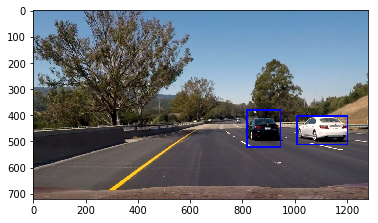

In [216]:
heat = np.zeros_like(image[:,:,0]).astype(np.float)

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

# Add heat to each box in box list
heat = add_heat(heat,box_list)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

#fig = plt.figure()
#plt.subplot(121)
#plt.imshow(draw_img)
#plt.title('Car Positions')
#plt.subplot(122)
#plt.imshow(heatmap, cmap='hot')
#plt.title('Heat Map')
#fig.tight_layout()

newimg2[:,:,0] = heatmap
newimg2[:,:,1] = heatmap
newimg2[:,:,2] = heatmap
newimg2 = newimg2*(255//np.max(newimg2))
plt.imshow(draw_img)
#print(labels[0].shape)
newimg2 = cv2.cvtColor(draw_img, cv2.COLOR_RGB2BGR);
cv2.imwrite('test6_final.jpg',newimg2)

In [20]:
AvgHeat = np.zeros((image.shape[0],image.shape[1]))
print(AvgHeat.shape)

(720, 1280)


In [162]:
def processimage(image):
    global AvgHeat
    box_list = []
    for scale in frange(1.4,1.61,0.1):
        out_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3 = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        box_list.extend(boxes)
        #print(scale)
        #print(len(box_list))
        #print(len(boxes))
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,box_list)
    #heat = apply_threshold(heat,1)
    heatmap = np.clip(heat, 0, 255)    
    AvgHeat = AvgHeat*0.6 + heatmap*0.4  
    newheat = apply_threshold(AvgHeat,0.5)
    labels = label(newheat)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    return draw_img

/home/vvs/miniconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


[203 203 211]


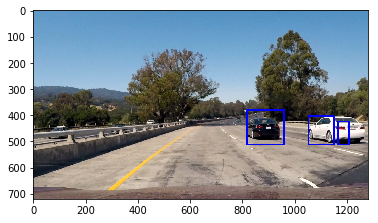

In [26]:
newimage = mpimg.imread('test_images/test1.jpg')
AvgHeat = np.zeros((newimage.shape[0],newimage.shape[1]))
processedimage = processimage(newimage)
plt.imshow(processedimage)
print(processedimage[450][900])

In [27]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [28]:
AvgHeat = np.zeros((newimage.shape[0],newimage.shape[1]))
video_output = 'processed_test_video.mp4'
clip1 = VideoFileClip("test_video.mp4")
video_clip = clip1.fl_image(processimage) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video processed_test_video.mp4
[MoviePy] Writing video processed_test_video.mp4


 97%|█████████▋| 38/39 [02:24<00:03,  3.80s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_test_video.mp4 

CPU times: user 4min 46s, sys: 4.3 s, total: 4min 50s
Wall time: 2min 24s


In [1099]:
AvgHeat = np.zeros((newimage.shape[0],newimage.shape[1]))
video_output = 'processed_project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(processimage) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video processed_project_video.mp4
[MoviePy] Writing video processed_project_video.mp4



100%|█████████▉| 1260/1261 [1:17:32<00:03,  3.68s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_project_video.mp4 

CPU times: user 2h 37min 45s, sys: 2min 22s, total: 2h 40min 7s
Wall time: 1h 17min 33s


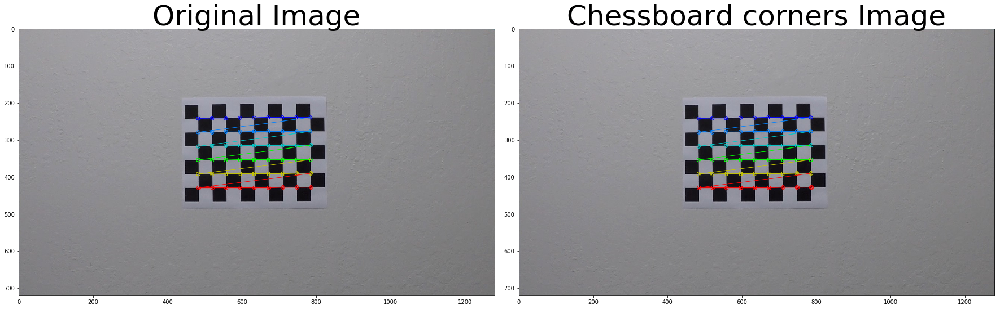

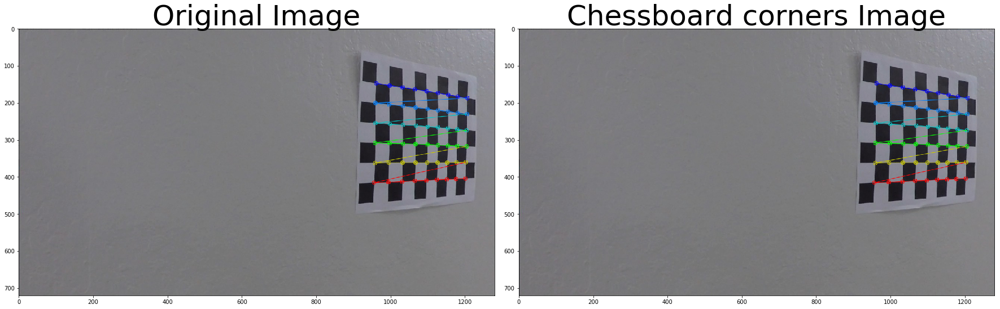

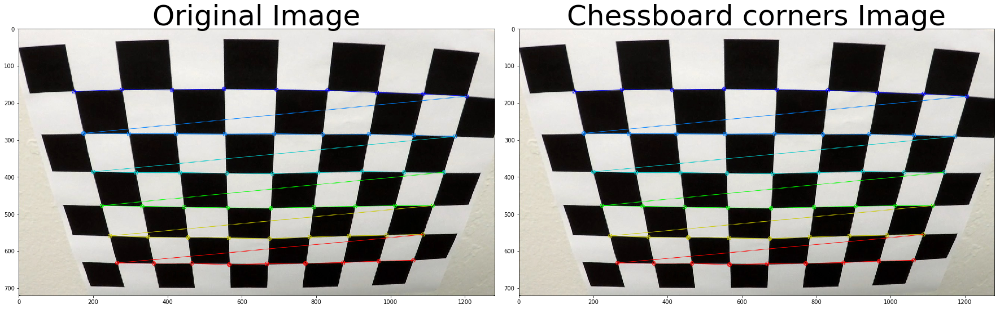

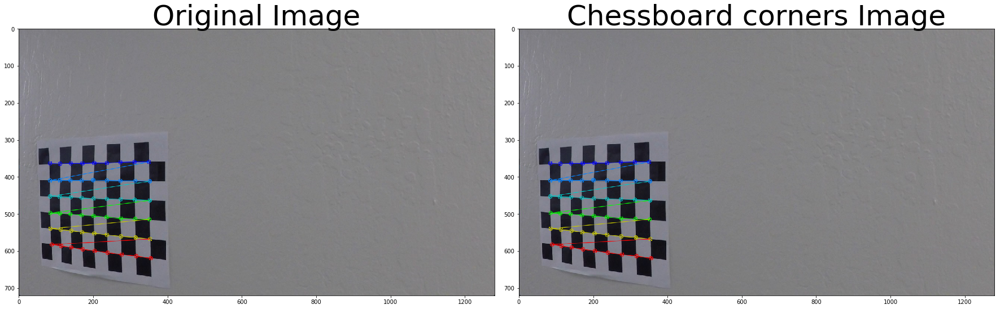

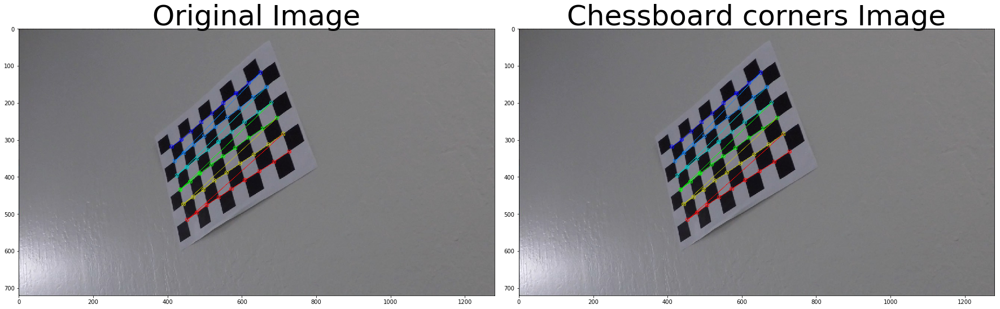

...

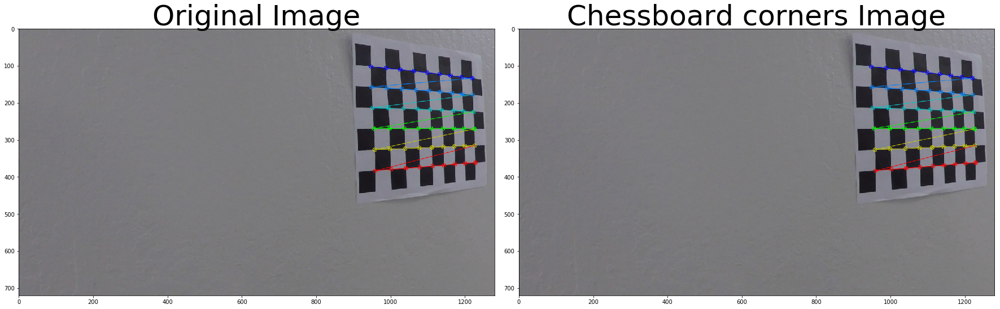

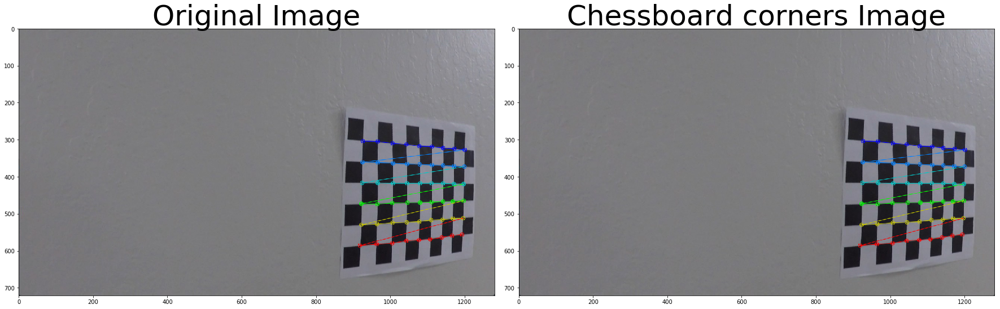

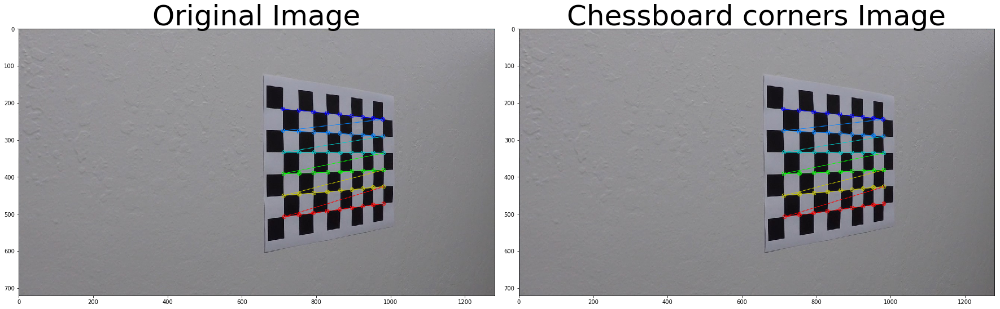

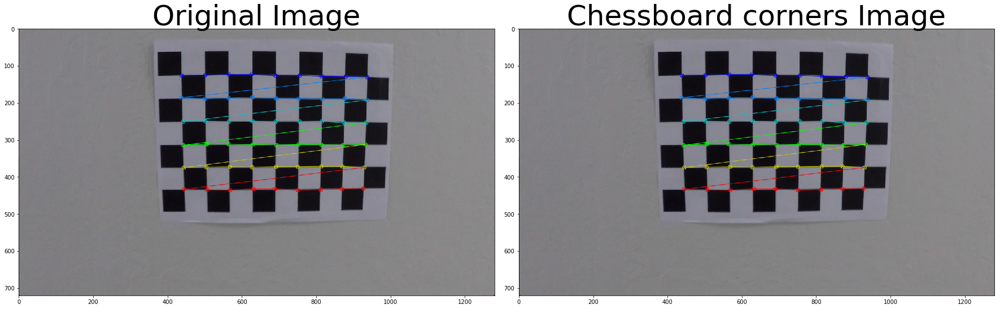

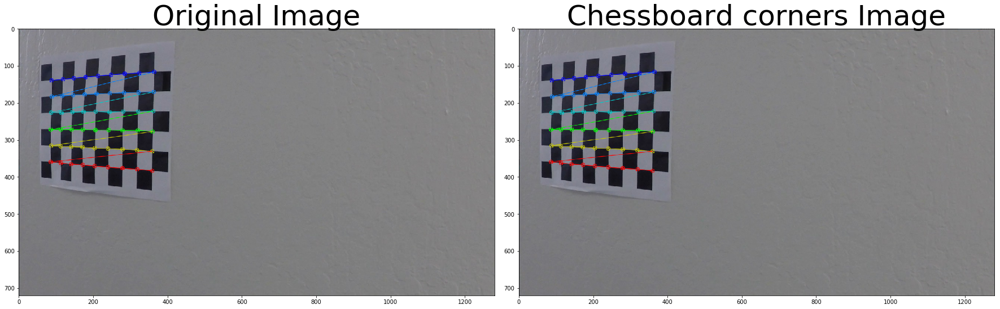

In [41]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        imgcorners = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(imgcorners)
        ax2.set_title('Chessboard corners Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        #cv2.waitKey(500)

#cv2.destroyAllWindows()

In [42]:
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [31]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    if(orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary

In [32]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(gradmag)
    sxbinary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary

In [33]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely,abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    sxbinary = np.zeros_like(direction)
    sxbinary[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return sxbinary
def hls_select(img, thresh=(0, 255)):
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    thresh = (thresh[0], thresh[1])
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary
def hsv_select(img, thresh=(0, 255)):
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    V = hsv[:,:,2]
    thresh = (thresh[0], thresh[1])
    binary = np.zeros_like(S)
    binary[(V > thresh[0]) & (V <= thresh[1])] = 1
    return binary
def get_thresholded(img):
    ksize = 5
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(25, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(25, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(25, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.75, 1.25))
    hls_binary = hls_select(img, thresh=(150, 255))
    hsv_binary = hsv_select(img, thresh=(150, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) | (hls_binary == 1) & (hsv_binary == 1))] = 1
    #combined[((hls_binary == 1) & (hsv_binary == 1))] = 1
    #combined[((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1) & (grady == 1))] = 1
    #combined = hsv_binary
    return combined
def gettransform(imgshape,offset,vertexes):
    src = np.float32([vertexes[0],vertexes[1],vertexes[2],vertexes[3]])
    dst = np.float32([[offset,offset],[imgshape[1]-offset,offset],[offset,imgshape[0]-offset],[imgshape[1]-offset,imgshape[0]-offset]])
    M = cv2.getPerspectiveTransform(src, dst)
    return M
def getperspectiveimage(img,M):
    warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return warped
def getpreprocessed(img):
    vertexes = [[[img.shape[1]*0.41,img.shape[0]*0.65]],[[img.shape[1]*0.59,img.shape[0]*0.65]],[[img.shape[1]*0.0,img.shape[0]*0.95]],[[img.shape[1]*1.0,img.shape[0]*0.95]]]
    M = gettransform(img.shape,0,vertexes)
    newimg = getperspectiveimage(img,M)
    finalimg = get_thresholded(newimg)    
    return finalimg
def getpreprocessed2(img):
    vertexes = [[[img.shape[1]*0.41,img.shape[0]*0.65]],[[img.shape[1]*0.59,img.shape[0]*0.65]],[[img.shape[1]*0.0,img.shape[0]*0.95]],[[img.shape[1]*1.0,img.shape[0]*0.95]]]
    M = gettransform(img.shape,0,vertexes)
    newimg = get_thresholded(img)
    finalimg = getperspectiveimage(newimg,M)    
    return finalimg
def getinvtransform(imgshape,offset,vertexes):
    src = np.float32([vertexes[0],vertexes[1],vertexes[2],vertexes[3]])
    dst = np.float32([[offset,offset],[imgshape[1]-offset,offset],[offset,imgshape[0]-offset],[imgshape[1]-offset,imgshape[0]-offset]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    return Minv
def getunpreprocessed(img):
    vertexes = [[[img.shape[1]*0.41,img.shape[0]*0.65]],[[img.shape[1]*0.59,img.shape[0]*0.65]],[[img.shape[1]*0.0,img.shape[0]*0.95]],[[img.shape[1]*1.0,img.shape[0]*0.95]]]
    Minv = getinvtransform(img.shape,0,vertexes)
    newimg = cv2.warpPerspective(img, Minv, (img.shape[1], img.shape[0])) 
    return newimg


In [45]:
def getinitiallines(imgorig):
    binary_warped = getpreprocessed(imgorig)
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255  
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    return out_img, left_fit,right_fit,left_fitx,right_fitx,left_curverad,right_curverad,ploty,leftx,rightx,lefty,righty       

def getnextlines(imgorig,left_fit,right_fit):
    binary_warped = getpreprocessed(imgorig)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    #print(out_img.shape)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    #print(left_fitx.shape)
    #print(ploty.shape)
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    
    return result,left_fit,right_fit,left_fitx,right_fitx,left_curverad,right_curverad,ploty,leftx,rightx,lefty,righty 
   
def getcurverad(fit,fitx,y_eval,binary_warped):
    curverad = ((1 + (2*fit[0]*y_eval + fit[1])**2)**1.5) / np.absolute(2*fit[0])
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(ploty*ym_per_pix, fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    # Now our radius of curvature is in meters
    return curverad

In [46]:
def processnewimage(imgorig):
    imgorig = cal_undistort(imgorig,objpoints,imgpoints)    
    binary_warped = getpreprocessed(imgorig)
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255  
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    y_eval = np.max(ploty)  
    left_curverad=getcurverad(left_fit,left_fitx,y_eval,imgorig)
    right_curverad=getcurverad(right_fit,right_fitx,y_eval,imgorig)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = getunpreprocessed(color_warp)
    # Combine the result with the original image
    result = cv2.addWeighted(imgorig, 1, newwarp, 0.3, 0)
    return result,left_fit,right_fit,left_fitx,right_fitx,left_curverad,right_curverad,ploty,leftx,rightx,lefty,righty
    #return result

In [47]:
def processnextimage(imgorig,left_fit,right_fit,prevlast_leftx,prevlast_rightx,prevlast_lefty,prevlast_righty):
    imgorig = cal_undistort(imgorig,objpoints,imgpoints)
    binary_warped = getpreprocessed(imgorig)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    #print(len(rightx))
    #print(len(righty))
    if(len(leftx) == 0):
        leftx = prevlast_leftx
    if(len(lefty) == 0):
        lefty = prevlast_lefty
    if(len(rightx) == 0):
        rightx = prevlast_rightx
    if(len(righty) == 0):
        righty = prevlast_righty
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]   
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    #print(out_img.shape)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    y_eval = np.max(ploty)
    left_curverad=getcurverad(left_fit,left_fitx,y_eval,imgorig)
    right_curverad=getcurverad(right_fit,right_fitx,y_eval,imgorig)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = getunpreprocessed(color_warp)
    # Combine the result with the original image
    result = cv2.addWeighted(imgorig, 1, newwarp, 0.3, 0)
    return result,left_fit,right_fit,left_fitx,right_fitx,left_curverad,right_curverad,ploty,leftx,rightx,lefty,righty

In [48]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.array([0,0,0], dtype='float')  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None


In [49]:
aveinterval = 5
LeftLine = Line()
RightLine = Line()
LeftLine.best_fit = np.zeros(3)
RightLine.best_fit = np.zeros(3)
def processimage(imgorig):
    global LeftLine
    global RightLine
    if(LeftLine.detected == False | RightLine.detected == False):
        
        result,LeftLine.current_fit,RightLine.current_fit,Left_xfitted,Right_xfitted,LeftLine.radius_of_curvature,RightLine.radius_of_curvature,ploty,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally = processnewimage(imgorig)
        
        if(len(LeftLine.recent_xfitted) < aveinterval):
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
        else:
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
            LeftLine.recent_xfitted.remove(LeftLine.recent_xfitted[0])
            RightLine.recent_xfitted.remove(RightLine.recent_xfitted[0]) 
        
        LeftLine.bestx = np.zeros_like(LeftLine.recent_xfitted[0])
        for i in range (len(LeftLine.recent_xfitted)):
            for j in range (LeftLine.recent_xfitted[0].shape[0]):
                LeftLine.bestx[j] = LeftLine.bestx[j] + LeftLine.recent_xfitted[i][j]/len(LeftLine.recent_xfitted)
        
        RightLine.bestx = np.zeros_like(RightLine.recent_xfitted[0])
        for i in range (len(RightLine.recent_xfitted)):
            for j in range (RightLine.recent_xfitted[0].shape[0]):
                RightLine.bestx[j] = RightLine.bestx[j] + RightLine.recent_xfitted[i][j]/len(RightLine.recent_xfitted)
        
        LeftLine.best_fit[0] = LeftLine.best_fit[0]*0.8 + 0.2*LeftLine.current_fit[0]
        LeftLine.best_fit[1] = LeftLine.best_fit[1]*0.8 + 0.2*LeftLine.current_fit[1]
        LeftLine.best_fit[2] = LeftLine.best_fit[2]*0.8 + 0.2*LeftLine.current_fit[2]
        RightLine.best_fit[0] = RightLine.best_fit[0]*0.8 + 0.2*RightLine.current_fit[0]
        RightLine.best_fit[1] = RightLine.best_fit[1]*0.8 + 0.2*RightLine.current_fit[1]
        RightLine.best_fit[2] = RightLine.best_fit[2]*0.8 + 0.2*RightLine.current_fit[2]
        
        left_pos = np.mean(LeftLine.bestx[:int(LeftLine.bestx.shape[0]/4)])
        right_pos = np.mean(RightLine.bestx[:int(RightLine.bestx.shape[0]/4)])
        
        bias = ((left_pos+right_pos)/2-result.shape[1]/2)*3.7/700
        cv2.putText(result,"Bias = "+str(bias) + "m", (100,180), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
       
        y_eval = np.max(ploty)
        left_curverad=getcurverad(LeftLine.best_fit,LeftLine.bestx,y_eval,result)
        right_curverad=getcurverad(RightLine.best_fit,RightLine.bestx,y_eval,result)
        curverad = (left_curverad+right_curverad)/2
        cv2.putText(result,"Curvature = "+str(curverad) + "m", (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
                
        if((np.abs(LeftLine.best_fit[0]-RightLine.best_fit[0]) < np.array(0.1)) and (np.abs(LeftLine.best_fit[1]-RightLine.best_fit[1]) < np.array(1.5))):
            LeftLine.detected = True
            RightLine.detected == True
        
    else:
        #print("truetrue")
        
        result,LeftLine.current_fit,RightLine.current_fit,Left_xfitted,Right_xfitted,LeftLine.radius_of_curvature,RightLine.radius_of_curvature,ploty,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally = processnextimage(imgorig,LeftLine.best_fit,RightLine.best_fit,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally)
        
        if(len(LeftLine.recent_xfitted) < aveinterval):
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
        else:
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
            LeftLine.recent_xfitted.remove(LeftLine.recent_xfitted[0])
            RightLine.recent_xfitted.remove(RightLine.recent_xfitted[0]) 
        
        LeftLine.bestx = np.zeros_like(LeftLine.recent_xfitted[0])
        for i in range (len(LeftLine.recent_xfitted)):
            for j in range (LeftLine.recent_xfitted[0].shape[0]):
                LeftLine.bestx[j] = LeftLine.bestx[j] + LeftLine.recent_xfitted[i][j]/len(LeftLine.recent_xfitted)
        
        RightLine.bestx = np.zeros_like(RightLine.recent_xfitted[0])
        for i in range (len(RightLine.recent_xfitted)):
            for j in range (RightLine.recent_xfitted[0].shape[0]):
                RightLine.bestx[j] = RightLine.bestx[j] + RightLine.recent_xfitted[i][j]/len(RightLine.recent_xfitted)
                
     
        LeftLine.best_fit[0] = LeftLine.best_fit[0]*0.8 + 0.2*LeftLine.current_fit[0]
        LeftLine.best_fit[1] = LeftLine.best_fit[1]*0.8 + 0.2*LeftLine.current_fit[1]
        LeftLine.best_fit[2] = LeftLine.best_fit[2]*0.8 + 0.2*LeftLine.current_fit[2]
        RightLine.best_fit[0] = RightLine.best_fit[0]*0.8 + 0.2*RightLine.current_fit[0]
        RightLine.best_fit[1] = RightLine.best_fit[1]*0.8 + 0.2*RightLine.current_fit[1]
        RightLine.best_fit[2] = RightLine.best_fit[2]*0.8 + 0.2*RightLine.current_fit[2]
        
        left_pos = np.mean(LeftLine.bestx[:int(LeftLine.bestx.shape[0]/4)])
        right_pos = np.mean(RightLine.bestx[:int(RightLine.bestx.shape[0]/4)])
        
        bias = ((left_pos+right_pos)/2-result.shape[1]/2)*3.7/700
        cv2.putText(result,"Bias = "+str(bias) + "m", (100,180), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
        y_eval = np.max(ploty)
        left_curverad=getcurverad(LeftLine.best_fit,LeftLine.bestx,y_eval,result)
        right_curverad=getcurverad(RightLine.best_fit,RightLine.bestx,y_eval,result)
        curverad = (left_curverad+right_curverad)/2
        cv2.putText(result,"Curvature = "+str(curverad) + "m", (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)       
        
        if((np.abs(LeftLine.best_fit[0]-RightLine.best_fit[0]) < np.array(0.1)) and (np.abs(LeftLine.best_fit[1]-RightLine.best_fit[1]) < np.array(1.5))):
            LeftLine.detected = True
            RightLine.detected == True
        else:
            LeftLine.detected = False
            RightLine.detected == False  
    return result


In [54]:
def processimage2(imgorig):
    global LeftLine
    global RightLine
    if(LeftLine.detected == False | RightLine.detected == False):
        
        result,LeftLine.current_fit,RightLine.current_fit,Left_xfitted,Right_xfitted,LeftLine.radius_of_curvature,RightLine.radius_of_curvature,ploty,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally = processnewimage(imgorig)
        
        if(len(LeftLine.recent_xfitted) < aveinterval):
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
        else:
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
            LeftLine.recent_xfitted.remove(LeftLine.recent_xfitted[0])
            RightLine.recent_xfitted.remove(RightLine.recent_xfitted[0]) 
        
        LeftLine.bestx = np.zeros_like(LeftLine.recent_xfitted[0])
        for i in range (len(LeftLine.recent_xfitted)):
            for j in range (LeftLine.recent_xfitted[0].shape[0]):
                LeftLine.bestx[j] = LeftLine.bestx[j] + LeftLine.recent_xfitted[i][j]/len(LeftLine.recent_xfitted)
        
        RightLine.bestx = np.zeros_like(RightLine.recent_xfitted[0])
        for i in range (len(RightLine.recent_xfitted)):
            for j in range (RightLine.recent_xfitted[0].shape[0]):
                RightLine.bestx[j] = RightLine.bestx[j] + RightLine.recent_xfitted[i][j]/len(RightLine.recent_xfitted)
        
        LeftLine.best_fit[0] = LeftLine.best_fit[0]*0.8 + 0.2*LeftLine.current_fit[0]
        LeftLine.best_fit[1] = LeftLine.best_fit[1]*0.8 + 0.2*LeftLine.current_fit[1]
        LeftLine.best_fit[2] = LeftLine.best_fit[2]*0.8 + 0.2*LeftLine.current_fit[2]
        RightLine.best_fit[0] = RightLine.best_fit[0]*0.8 + 0.2*RightLine.current_fit[0]
        RightLine.best_fit[1] = RightLine.best_fit[1]*0.8 + 0.2*RightLine.current_fit[1]
        RightLine.best_fit[2] = RightLine.best_fit[2]*0.8 + 0.2*RightLine.current_fit[2]
        
        left_pos = np.mean(LeftLine.bestx[:int(LeftLine.bestx.shape[0]/4)])
        right_pos = np.mean(RightLine.bestx[:int(RightLine.bestx.shape[0]/4)])
        
        bias = ((left_pos+right_pos)/2-result.shape[1]/2)*3.7/700
        cv2.putText(result,"Bias = "+str(bias) + "m", (100,180), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
       
        y_eval = np.max(ploty)
        left_curverad=getcurverad(LeftLine.best_fit,LeftLine.bestx,y_eval,result)
        right_curverad=getcurverad(RightLine.best_fit,RightLine.bestx,y_eval,result)
        curverad = (left_curverad+right_curverad)/2
        cv2.putText(result,"Curvature = "+str(curverad) + "m", (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
                
        if((np.abs(LeftLine.best_fit[0]-RightLine.best_fit[0]) < np.array(0.1)) and (np.abs(LeftLine.best_fit[1]-RightLine.best_fit[1]) < np.array(1.5))):
            LeftLine.detected = True
            RightLine.detected == True
        
    else:
        #print("truetrue")
        
        result,LeftLine.current_fit,RightLine.current_fit,Left_xfitted,Right_xfitted,LeftLine.radius_of_curvature,RightLine.radius_of_curvature,ploty,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally = processnextimage(imgorig,LeftLine.best_fit,RightLine.best_fit,LeftLine.allx,RightLine.allx,LeftLine.ally,RightLine.ally)
        
        if(len(LeftLine.recent_xfitted) < aveinterval):
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
        else:
            LeftLine.recent_xfitted.append(Left_xfitted)
            RightLine.recent_xfitted.append(Right_xfitted)
            LeftLine.recent_xfitted.remove(LeftLine.recent_xfitted[0])
            RightLine.recent_xfitted.remove(RightLine.recent_xfitted[0]) 
        
        LeftLine.bestx = np.zeros_like(LeftLine.recent_xfitted[0])
        for i in range (len(LeftLine.recent_xfitted)):
            for j in range (LeftLine.recent_xfitted[0].shape[0]):
                LeftLine.bestx[j] = LeftLine.bestx[j] + LeftLine.recent_xfitted[i][j]/len(LeftLine.recent_xfitted)
        
        RightLine.bestx = np.zeros_like(RightLine.recent_xfitted[0])
        for i in range (len(RightLine.recent_xfitted)):
            for j in range (RightLine.recent_xfitted[0].shape[0]):
                RightLine.bestx[j] = RightLine.bestx[j] + RightLine.recent_xfitted[i][j]/len(RightLine.recent_xfitted)
                
     
        LeftLine.best_fit[0] = LeftLine.best_fit[0]*0.8 + 0.2*LeftLine.current_fit[0]
        LeftLine.best_fit[1] = LeftLine.best_fit[1]*0.8 + 0.2*LeftLine.current_fit[1]
        LeftLine.best_fit[2] = LeftLine.best_fit[2]*0.8 + 0.2*LeftLine.current_fit[2]
        RightLine.best_fit[0] = RightLine.best_fit[0]*0.8 + 0.2*RightLine.current_fit[0]
        RightLine.best_fit[1] = RightLine.best_fit[1]*0.8 + 0.2*RightLine.current_fit[1]
        RightLine.best_fit[2] = RightLine.best_fit[2]*0.8 + 0.2*RightLine.current_fit[2]
        
        left_pos = np.mean(LeftLine.bestx[:int(LeftLine.bestx.shape[0]/4)])
        right_pos = np.mean(RightLine.bestx[:int(RightLine.bestx.shape[0]/4)])
        
        bias = ((left_pos+right_pos)/2-result.shape[1]/2)*3.7/700
        cv2.putText(result,"Bias = "+str(bias) + "m", (100,180), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)
        y_eval = np.max(ploty)
        left_curverad=getcurverad(LeftLine.best_fit,LeftLine.bestx,y_eval,result)
        right_curverad=getcurverad(RightLine.best_fit,RightLine.bestx,y_eval,result)
        curverad = (left_curverad+right_curverad)/2
        cv2.putText(result,"Curvature = "+str(curverad) + "m", (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255),3,cv2.LINE_AA)       
        
        if((np.abs(LeftLine.best_fit[0]-RightLine.best_fit[0]) < np.array(0.1)) and (np.abs(LeftLine.best_fit[1]-RightLine.best_fit[1]) < np.array(1.5))):
            LeftLine.detected = True
            RightLine.detected == True
        else:
            LeftLine.detected = False
            RightLine.detected == False  
            
    global AvgHeat
    box_list = []
    for scale in frange(1.4,1.61,0.1):
        out_img,boxes,hogvisualization1,hogvisualization2,hogvisualization3 = find_cars(imgorig, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        box_list.extend(boxes)
        #print(scale)
        #print(len(box_list))
        #print(len(boxes))
    heat = np.zeros_like(imgorig[:,:,0]).astype(np.float)
    heat = add_heat(heat,box_list)
    #heat = apply_threshold(heat,1)
    heatmap = np.clip(heat, 0, 255)    
    AvgHeat = AvgHeat*0.6 + heatmap*0.4  
    newheat = apply_threshold(AvgHeat,0.5)
    labels = label(newheat)
    draw_img = draw_labeled_bboxes(np.copy(result), labels)
            
    return draw_img


In [55]:
AvgHeat = np.zeros((newimage.shape[0],newimage.shape[1]))
video_output = 'processed_test_video2.mp4'
clip1 = VideoFileClip("test_video.mp4")
video_clip = clip1.fl_image(processimage2) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video processed_test_video2.mp4
[MoviePy] Writing video processed_test_video2.mp4


 97%|█████████▋| 38/39 [03:05<00:04,  4.92s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_test_video2.mp4 

CPU times: user 6min 35s, sys: 6.04 s, total: 6min 41s
Wall time: 3min 6s


In [52]:
LeftLine = Line()
RightLine = Line()
LeftLine.best_fit = np.zeros(3)
RightLine.best_fit = np.zeros(3)

In [56]:
AvgHeat = np.zeros((newimage.shape[0],newimage.shape[1]))
video_output = 'processed_project_video2.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(processimage2) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video processed_project_video2.mp4
[MoviePy] Writing video processed_project_video2.mp4


100%|█████████▉| 1260/1261 [1:42:19<00:04,  4.87s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_project_video2.mp4 

CPU times: user 3h 38min 26s, sys: 3min 26s, total: 3h 41min 53s
Wall time: 1h 42min 19s
